## importing environmental data

This data comes from the NAS and was converted to a csv file in matlab with the script convert_tsv.m

1. wind speed $(m/s)$
2. wind direction degress from true North $(90^{\circ} =$ wind from east)
3. solar  $(W/m^2)$
4. temperature $(^{\circ}C)$

In [50]:
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.dates as mdates #for working with dates in plots
import seaborn as sns
from calendar import month_name as mn
import datetime
from matplotlib.dates import MonthLocator, DateFormatter
import numpy as np

dfenv = pd.read_pickle("../data/dfenv.pkl")
dfdaily = pd.read_pickle("../data/mvco_daily.pkl")
dfnut = pd.read_pickle("../data/dfnut.pkl")
dfnut = dfnut[dfnut.year >= 2006]
dfnut.set_index("date",inplace = True)
dfdaily.set_index("date", inplace = True)

print(dfnut.columns)

Index(['Event_Num', 'Event_Num_Niskin', 'Start_Date', 'Start_Time_UTC', 'Lat',
       'Lon', 'Depth', 'NO3_a', 'NO3_b', 'NO3_c', 'NH4_a', 'NH4_b', 'NH4_c',
       'SiO2_a', 'SiO2_b', 'SiO2_c', 'PO4_a', 'PO4_b', 'PO4_c', 'time',
       'datetime', 'month', 'doy', 'doy_numeric', 'year', 'NO3_mean',
       'NH4_mean', 'PO4_mean', 'SiO2_mean'],
      dtype='object')


In [43]:
plt.figure(figsize=(15, 8), dpi=1000)
plt.scatter(dfnut.date,dfnut.NO3_a,c = "r", s= 5, marker = "+")
plt.scatter(dfnut.date,dfnut.NO3_b,c = "b", s= 5, marker = "o")
plt.scatter(dfnut.date,dfnut.NO3_c,c = "g", s= 5, marker = "x")
plt.title("Nutrient Replicates")

In [51]:
dfdaily.combine_first(dfnut)dd.describe().transpose()

,count,mean,std,min,25%,50%,75%,max
AvgSolar,5835.0,157.444783,96.959812,-3.050000,79.533441,144.977778,233.974306,851.388235
AvgWindDir,6526.0,195.804693,72.677579,12.191667,147.471875,206.747569,248.971007,343.554167
AvgWindSpeed,6654.0,5.167673,2.490353,0.598571,3.450347,4.679167,6.272222,43.285714
Beam_temperature,5101.0,11.815423,6.368608,-1.419508,6.016125,12.113925,17.982170,22.724272
Beam_temperature_corrected,7511.0,11.585601,6.363358,-1.429990,5.557834,11.897190,17.814153,22.724272
Depth,967.0,8.071665,7.417988,0.000000,2.000000,6.000000,12.000000,39.600000
Lat,967.0,41.305027,0.047659,41.136400,41.323300,41.325000,41.325000,41.339000
Lon,967.0,-70.560554,0.035174,-70.683900,-70.566700,-70.565700,-70.565000,-70.415100
NH4_a,959.0,1.236184,1.188154,0.000000,0.450540,0.948867,1.737530,12.529653
NH4_b,925.0,1.271754,1.215020,0.000000,0.464000,0.964918,1.816314,11.364104


In [55]:
PATH = "../data/dfmerged_dailysynenv.csv"
df = pd.read_csv(PATH)#.drop_duplicates(subset = "date") #remove duplicate days
df.date = pd.to_datetime(df.date, format = "%Y-%m-%d")
df.describe().transpose()
# df.head()

,count,mean,std,min,25%,50%,75%,max
AvgSolar,3575.0,151.168763,95.092767,-2.800000,74.882639,135.881944,223.602778,851.388235
AvgWindDir,3575.0,196.848362,72.442314,13.912500,149.199306,208.754167,249.670139,340.055556
AvgWindSpeed,3575.0,5.047937,2.234000,0.729167,3.526389,4.668056,6.047222,25.530556
Beam_temperature_corrected,3575.0,10.836090,6.373021,-1.419508,4.727163,10.991591,16.680652,21.855795
NH4_mean,1011.0,1.242777,1.088931,0.000000,0.507853,0.949099,1.784963,8.084891
NO3_mean,1011.0,0.345125,0.677637,0.000000,0.000000,0.080211,0.353688,6.561361
PO4_mean,1011.0,0.201055,0.179226,0.000000,0.070666,0.158569,0.283627,1.632589
SiO2_mean,1011.0,3.651877,3.574976,0.000000,1.236628,2.684718,4.980182,44.106465
doy_numeric,3575.0,175.994685,106.671996,1.000000,81.000000,168.000000,270.000000,366.000000
synconc,4694.0,40819.405820,48958.546584,50.135234,2081.095442,21311.463920,62815.271450,323472.170691


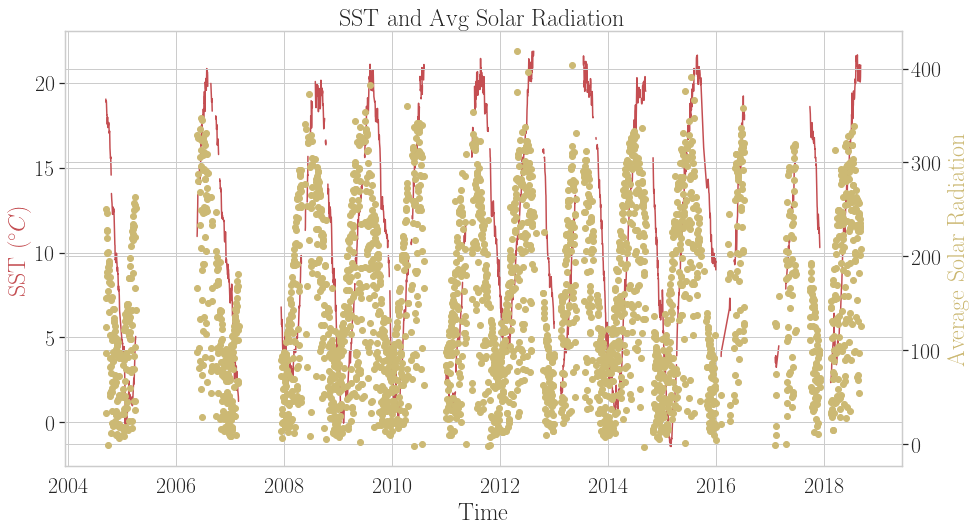

In [17]:

x = np.arange(0, 10, 0.1)
y1 = 0.05 * x**2
y2 = -1 *y1

fig, ax1 = plt.subplots(figsize = (15,8))

ax2 = ax1.twinx()
ax1.plot(df.date, df.Beam_temperature_corrected, 'r-')
ax2.scatter(df.date[df.AvgSolar < 450], df.AvgSolar[df.AvgSolar < 450], c = 'y')

ax1.set_xlabel('Time')
ax1.set_ylabel('SST ($^{\circ} C$)', color='r')
ax2.set_ylabel('Average Solar Radiation', color='y')
plt.title("SST and Avg Solar Radiation")

plt.show()

In [18]:
plt.figure(figsize=(15, 8), dpi=1000)

# for Palatino and other serif fonts use:
sns.set(font_scale = 2, style = "whitegrid")

plt.rcParams.update({
    "text.usetex": True,
    "font.family": "serif",
    "font.serif": ["Computer Modern Roman"]})

sns.scatterplot(data = df[df.AvgSolar < 450],x = "date", y = "AvgSolar",marker = ".")
plt.xlabel("Year")
plt.ylabel("Solar Irradiance $(W m^{-2})$")

Text(0, 0.5, 'Solar Irradiance $(W m^{-2})$')

In [20]:
plt.figure(figsize=(15, 8), dpi=1000)

# for Palatino and other serif fonts use:
sns.set(font_scale = 2, style = "whitegrid")

plt.rcParams.update({
    "text.usetex": True,
    "font.family": "serif",
    "font.serif": ["Computer Modern Roman"]})

sns.scatterplot(data = df,x = "date", y = "Beam_temperature_corrected", marker = '.')
plt.xlabel("Year")
plt.ylabel("Temperature $(^{\circ} C)$")

Text(0, 0.5, 'Temperature $(^{\\circ} C)$')

In [44]:
plt.figure(figsize=(15, 8), dpi=1000)

# for Palatino and other serif fonts use:
sns.set(font_scale = 2, style = "whitegrid")

plt.rcParams.update({
    "text.usetex": True,
    "font.family": "serif",
    "font.serif": ["Computer Modern Roman"]})

plt.scatter(x =df.date , y = df.NO3_mean)
plt.xlabel("Year")
plt.ylabel("$ [NO_3] $")
plt.title("Nitrate Concentrations")

Text(0.5, 1.0, 'Nitrate Concentrations')

In [79]:
plt.figure(figsize=(15, 8), dpi=1000)

# for Palatino and other serif fonts use:
sns.set(font_scale = 2, style = "whitegrid")

plt.rcParams.update({
    "text.usetex": True,
    "font.family": "serif",
    "font.serif": ["Computer Modern Roman"]})

plt.scatter(x =df.date, y = df.NH4_mean)
plt.xlabel("Year")
plt.ylabel("$ [NH_4] $")
plt.title("Ammonia Concentrations")

Text(0.5, 1.0, 'Ammonia Concentrations')

In [81]:
plt.figure(figsize=(15, 8), dpi=1000)

# for Palatino and other serif fonts use:
sns.set(font_scale = 2, style = "whitegrid")

plt.rcParams.update({
    "text.usetex": True,
    "font.family": "serif",
    "font.serif": ["Computer Modern Roman"]})

plt.scatter(x =dfnut["datetime"], y = dfnut["SiO2_mean"])
plt.xlabel("Year")
plt.ylabel("$ [SiO2] $")
plt.title("Silicon Dioxide Concentrations")

Text(0.5, 1.0, 'Silicon Dioxide Concentrations')